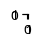

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150
sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.data_processing import BL62_VALUES, BL62FREQ_VALUES, HLAS, AA_KEYS
from src.utils import pkl_load, pkl_dump, get_palette
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE
from src.metrics import reconstruction_accuracy, VAELoss, TripletLoss, CombinedVAELoss, compute_cosine_distance
from src.datasets import TCRSpecificDataset, FullTCRDataset
import torch
from torch import optim
from torch.utils.data import RandomSampler, SequentialSampler
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180

In [2]:
# Load models together
from src.torch_utils import load_model_full
from src.metrics import compute_cosine_distance
from src.utils import get_class_initcode_keys
from src.models import BimodalVAEClassifier, FullTCRVAE, PeptideClassifier
from src.datasets import BimodalTCRpMHCDataset, FullTCRDataset, LatentTCRpMHCDataset, TCRSpecificDataset
from src.train_eval import predict_bimodal, predict_model
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
pos_df = pd.read_csv('../data/filtered/230927_nettcr_positives_only.csv')
mix_df = pd.read_csv('../data/filtered/231205_nettcr_old_26pep_with_swaps.csv')


def get_model(folder):
    pt = glob.glob(folder+'/*.pt')[0]
    js = glob.glob(folder+'/*.json')[0]
    model = load_model_full(pt, js, return_json=False, verbose=False)
    return model
    

# do heatmap for retrained model

In [3]:
from src.datasets import BimodalTCRpMHCDataset
# dataset_bimodal = BimodalTCRpMHCDataset(mix_df, 0, 0, 22, 0, 0, 23, encoding='BL50LO', pad_scale=-20,  pep_encoding='BL50LO', pep_pad_scale=-20)
# dataset_a3b3 = FullTCRDataset(pos_df, 0, 0, 22, 0, 0, 23, encoding='BL50LO', pad_scale=-20)
# dataset_full = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, encoding='BL50LO', pad_scale=-20)
dataset_bimodal_full = BimodalTCRpMHCDataset(mix_df, 7,8, 22, 6, 7, 23, encoding='BL50LO', pad_scale=-20, pep_encoding='BL50LO', pep_pad_scale=-20)
loader_bimodal_full = dataset_bimodal_full.get_dataloader(1024, SequentialSampler)
# loader_bimodal = dataset_bimodal.get_dataloader(1024, SequentialSampler)
# loader_a3b3 = dataset_a3b3.get_dataloader(1024, SequentialSampler)
# loader_full = dataset_full.get_dataloader(1024, SequentialSampler)

In [4]:
# here, check the predictions using the new model trained with smaller margin and longer warmup
model = get_model('../output/240115_twostageFullTCR_WarmUpLowerMargin2Kepochs_KFold_1_240115_1401_TIGHT/')
predictions = predict_bimodal(model, dataset_bimodal_full, loader_bimodal_full)
predictions['model_fold']=1
predictions['set'] = predictions.apply(lambda x: 'train' if x['model_fold']!=x['partition'] else 'valid', axis=1)

MLP metrics: auc: 0.943	auc_01: 0.856	auc_01_real: 0.727	precision: 0.800	accuracy: 0.923	AP: 0.841


In [5]:
binders = predictions.query('binder==1')
z = torch.from_numpy(binders[[x for x in binders.columns if x.startswith('z_')]].values)
distances = compute_cosine_distance(z)

In [6]:
preds_sorted = binders.sort_values('peptide').reset_index(drop=True)
zcols = [x for x in preds_sorted.columns if x.startswith('z_')]
dist_sorted = compute_cosine_distance(torch.from_numpy(preds_sorted[zcols].values))

In [12]:
pkl_dump(dist_sorted, 'tighterMargin_dist_sorted.pkl')
pkl_dump(distances, 'tighterMargin_distances.pkl')

/Users/riwa/Documents/code/tclustr/notebooks/tighterMargin_dist_sorted.pkl saved.
/Users/riwa/Documents/code/tclustr/notebooks/tighterMargin_distances.pkl saved.


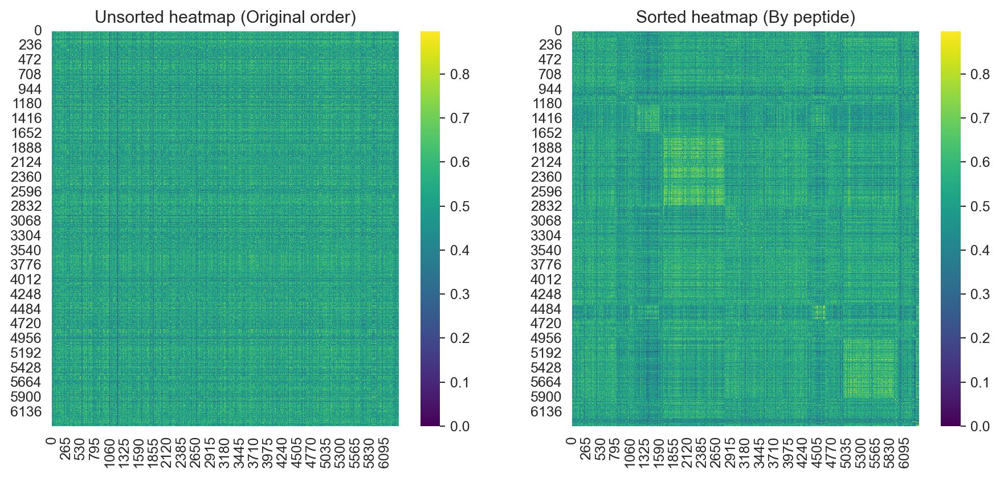

In [16]:
sort_by_pep = pos_df.reset_index(drop=True).sort_values('peptide').index.values
mve = distances.max().item()

f,a = plt.subplots(1,2, figsize=(12,5))
sns.heatmap(data= mve - distances, ax = a[0], cmap = 'viridis')
a[0].set_title('Unsorted heatmap (Original order)')
sns.heatmap(data= mve - dist_sorted, ax = a[1], cmap = 'viridis')
a[1].set_title('Sorted heatmap (By peptide)')
f.savefig('../output/240110_REDO_ClusteringComparisons/heatmap_Bimodal_LongerWarm_TighterMargin_Fold1.png', dpi=200, bbox_inches='tight')

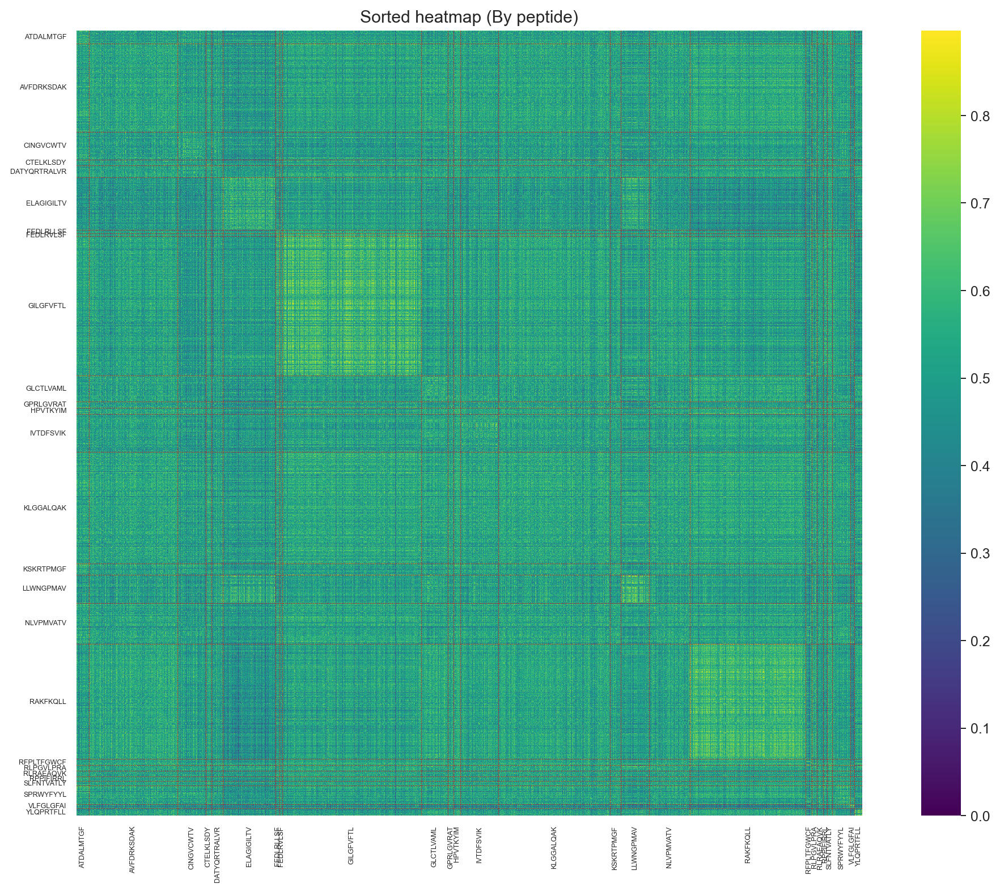

In [15]:
# Here remake the plot but with custom tickmarks, and add the peptide labels with the corresponding ticks
sort_by_pep = pos_df.reset_index(drop=True).sort_values('peptide').index.values
mve = dist_sorted.max().item()

f, a = plt.subplots(1,1, figsize=(15,10))
sns.heatmap(data= mve - dist_sorted, ax = a, square=True, cmap='viridis')
a.set_title('Sorted heatmap (By peptide)')

# drawing custom lines across + adding xticks
prev_loc=0
xticks = []
for peptide in sorted(pos_df.peptide.unique()):
    max_loc = np.where(pos_df.sort_values('peptide').peptide.values==peptide)[0].max()
    # Middle location for tickmarks
    middle_loc = (np.where(pos_df.sort_values('peptide').peptide.values==peptide)[0].min()+np.where(pos_df.sort_values('peptide').peptide.values==peptide)[0].max())/2
    xticks.append(middle_loc)

    # plot the line at max_loc, i.e. the limit of the index of the last datapoint in the sorted df
    a.axvline(x=max_loc, ymin=-0.5, ymax=1, color='r', linestyle=':', linewidth=0.5)
    a.axhline(y=max_loc, xmin=-0.5, xmax=1, color='r', linestyle=':', linewidth=0.5)
    prev_loc = max_loc

a.set_xticks(xticks)
a.set_yticks(xticks)
a.set_yticklabels(sorted(pos_df.peptide.unique()), ha='right', va='center', fontsize=5)
a.set_xticklabels(sorted(pos_df.peptide.unique()), rotation=90, ha='center', va='top', fontsize=5)
f.savefig('../output/240110_REDO_ClusteringComparisons/heatmap_Bimodal_LongerWarm_TighterMargin_PepSortedLabelled.png', dpi=200, bbox_inches='tight')

# New dataset

## Adding Peptide sequence

In [21]:
# Here, best approach seems to be just modifying FullTCRDataset for now 
from src.datasets import FullTCRDataset

tcrpep_dataset = FullTCRDataset(pos_df, 0, 0, 0, 0, 0, 23, 12)
tcrpep_dataset.x.shape

torch.Size([6353, 700])

## Adding positional and/or length encoding

In [22]:
class TestDs(VAEDataset):

    def __init__(self, df, max_len_a1, max_len_a2, max_len_a3, max_len_b1, max_len_b2, max_len_b3, max_len_pep=0,
                 encoding='BL50LO', pad_scale=None, a1_col='A1', a2_col='A2', a3_col='A3', b1_col='B1', b2_col='B2',
                 b3_col='B3', pep_col='original_peptide', add_positional_encoding=True, pep_weighted=False, pep_weight_scale=3.8):
        super(FullTCRDataset, self).__init__()
        # TODO : Current behaviour If max_len_x = 0, then don't use that chain...
        #        Is that the most elegant way to do this ?
        assert not all([x == 0 for x in [max_len_a1, max_len_a2, max_len_a3,
                                         max_len_b1, max_len_b2, max_len_b3]]), \
            'All loops max_len are 0! No chains will be added'

        x_seq = []
        self.max_len_a1 = max_len_a1
        self.max_len_a2 = max_len_a2
        self.max_len_a3 = max_len_a3
        self.max_len_b1 = max_len_b1
        self.max_len_b2 = max_len_b2
        self.max_len_b3 = max_len_b3
        self.max_len_pep = max_len_pep
        self.use_a1 = not (max_len_a1 == 0)
        self.use_a2 = not (max_len_a2 == 0)
        self.use_a3 = not (max_len_a3 == 0)
        self.use_b1 = not (max_len_b1 == 0)
        self.use_b2 = not (max_len_b2 == 0)
        self.use_b3 = not (max_len_b3 == 0)
        self.use_pep = not (max_len_pep == 0)

        # bad double loop because brain slow
        for max_len, seq_col in zip([max_len_a1, max_len_a2, max_len_a3, max_len_b1, max_len_b2, max_len_b3, max_len_pep],
                                    [a1_col, a2_col, a3_col, b1_col, b2_col, b3_col, pep_col]):
            if max_len != 0:
                df['len_q'] = df[seq_col].apply(len)
                df = df.query('len_q <= @max_len')
        for max_len, seq_col in zip([max_len_a1, max_len_a2, max_len_a3, max_len_b1, max_len_b2, max_len_b3, max_len_pep],
                                    [a1_col, a2_col, a3_col, b1_col, b2_col, b3_col, pep_col]):
            if max_len != 0:
                encoded = encode_batch(df[seq_col], max_len, encoding, pad_scale)
                x_seq.append(encoded.flatten(start_dim=1))

        self.df = df.drop(columns=['len_q']).reset_index(drop=True)
        self.x = torch.cat(x_seq, dim=1)
        self.pep_weighted = pep_weighted
        # Here save a weight that is peptide specific to give more/less importance to peptides that are less/more frequent
        if pep_weighted:
            pepweights = np.log2(len(self.df) / self.df.groupby(['peptide']).agg(count=(f'{b3_col}', 'count')))
            self.pep_weights = torch.from_numpy(
                self.df.apply(lambda x: pepweights.loc[x['peptide']], axis=1).values / pep_weight_scale).flatten(
                start_dim=0)
        else:
            self.pep_weights = torch.ones([len(self.x)])


In [23]:
pd.set_option('display.max_columns', 22)
sample = pos_df.sample(5, random_state=13)
cols = list(filter(lambda x: len(x)==2, sample.columns)) + ['peptide']
maxlens = {k:v for (k,v) in zip(cols,[7,8,22,6,7,23, 12]) }
for c in cols:
    sample[f'len_{c}'] = sample[c].apply(len)
    sample[f'fl_{c}'] = sample.apply(lambda x: x[f'len_{c}'] / maxlens[c], axis=1)

sample[cols + [f'len_{c}' for c in cols] + [f'fl_{c}' for c in cols]]

,A1,A2,A3,B1,B2,B3,peptide,len_A1,len_A2,len_A3,len_B1,len_B2,len_B3,len_peptide,fl_A1,fl_A2,fl_A3,fl_B1,fl_B2,fl_B3,fl_peptide
2609,TSINN,IRSNERE,ATDPDTGRRALT,SGHDT,YYEEEE,ASSLLIREAYT,KLGGALQAK,5,7,12,5,6,11,9,0.714286,0.875,0.545455,0.833333,0.857143,0.478261,0.750000
684,DRGSQS,IYSNGD,AVSIGFGNVLH,MNHEY,SMNVEV,ASSGRAGTGVQF,ELAGIGILTV,6,6,11,5,6,12,10,0.857143,0.750,0.500000,0.833333,0.857143,0.521739,0.833333
3283,NSASQS,VYSSG,VVNSYGQNFV,KGHDR,SFDVKD,ATSDRLAGGELF,KLGGALQAK,6,5,10,5,6,12,9,0.857143,0.625,0.454545,0.833333,0.857143,0.521739,0.750000
765,VSGNPY,YITGDNLV,ASPGGGGSQGNLI,LNHDA,SQIVND,ASRKRGTAPQF,GILGFVFTL,6,8,13,5,6,11,9,0.857143,1.000,0.590909,0.833333,0.857143,0.478261,0.750000
838,TSINN,IRSNERE,ATDSGGSNYKLT,SQVTM,ANQGSEA,SVGAGEDDEQY,RAKFKQLL,5,7,12,5,7,11,8,0.714286,0.875,0.545455,0.833333,1.000000,0.478261,0.666667


In [24]:
def positional_encode(seq, pad = (0, 0)):
    return F.pad(torch.ones([len(seq)]), pad = (pad[0], pad[1]-len(seq)))

def batch_positional_encode(seqs, pad = (0, 0)):
    return torch.stack([positional_encode(seq, pad) for seq in seqs])

In [139]:
from src.data_processing import encode_batch
cols = list(filter(lambda x: len(x)==2, sample.columns)) + ['peptide']

selected = ['A1', 'A3', 'B3', 'peptide']
maxlens = {k:v for (k,v) in zip(cols,[7,8,22,6,7,23, 12])}
maxlensvalues = list([maxlens[k] for k in selected])
pads = {k:(sum(maxlensvalues[:i]), sum(maxlensvalues)-sum(maxlensvalues[:i]) ) for i,k in enumerate(selected)}

pos_encodings = []
seq_1 = []
seq_2 = []
for c in selected:
    seq_1.append(encode_batch(sample[c], maxlens[c], encoding='BL50LO', pad_scale=-20))
    seq_2.append(encode_batch(sample[c], maxlens[c], encoding='BL50LO', pad_scale=-20).flatten(start_dim=1))
    pos_encodings.append(batch_positional_encode(sample[c], pads[c]))

In [147]:
# This is what is in the current dataset implementation before flattening for dim 1
flat_seq = torch.cat(seq_1, axis=1).flatten(start_dim=1)
flat_pos = torch.stack(pos_encodings,axis=2).flatten(start_dim=1)

In [133]:
reshaped_pos_encodings = torch.stack(pos_encodings, axis=2).float()
random_pos = torch.normal(0, 2, size=reshaped_pos_encodings.shape).float()

targets = reshaped_pos_encodings[:3, :2]
preds = (F.sigmoid(random_pos)[:3, :2]>0.5).float()

accuracy = (preds==targets)
accuracy

tensor([[[ True, False,  True,  True],
         [False, False, False,  True]],

        [[False, False, False,  True],
         [False, False,  True, False]],

        [[ True,  True, False,  True],
         [ True, False,  True,  True]]])

In [189]:
import torch.nn as nn

class LossParent(nn.Module):
    def __init__(self):
        super(LossParent, self).__init__()
        self.counter = 0

    def increment_counter(self):
        self.counter += 1

class ClassA(LossParent):
    def __init__(self):
        super(ClassA, self).__init__()

class ClassB(LossParent):
    def __init__(self):
        super(ClassB, self).__init__()
        self.class_a_in_b = ClassA()

    def increment_counter(self):
        super(ClassB, self).increment_counter()
        self.class_a_in_b.increment_counter()

class_a_instance = ClassA()
print("Counter in ClassA before:", class_a_instance.counter)

class_b_instance = ClassB()
class_b_instance.increment_counter()

print("Counter in ClassB:", class_b_instance.counter)
print("Counter in ClassA after:", class_b_instance.class_a_in_b.counter)


Counter in ClassA before: 0
Counter in ClassB: 1
Counter in ClassA after: 1


In [190]:
import torch.nn as nn

class LossParent(nn.Module):
    def __init__(self):
        super(LossParent, self).__init__()
        self._counter = 0

    @property
    def counter(self):
        return self._counter

    def increment_counter(self):
        self._counter += 1

class ClassA(LossParent):
    def __init__(self):
        super(ClassA, self).__init__()

class ClassB(LossParent):
    def __init__(self):
        super(ClassB, self).__init__()
        self.class_a_in_b = ClassA()

class_b_instance = ClassB()

# Accessing the counter property from ClassA through ClassB
print("Counter in ClassA through ClassB:", class_b_instance.class_a_in_b.counter)

# Incrementing the counter in ClassB, which indirectly increments ClassA's counter
class_b_instance.increment_counter()
print("Counter in ClassB:", class_b_instance.counter)
print("Counter in ClassA after:", class_b_instance.class_a_in_b.counter)


Counter in ClassA through ClassB: 0
Counter in ClassB: 1
Counter in ClassA after: 0


In [191]:
def print_loss_metric(epoch, train_loss, valid_loss, train_metric, valid_metric):
    header=f'Epoch: {epoch}'
    train_header = f'Train: '
    train_losses_text = '\tLoss: '+ '\t'.join([f'{k}: {train_loss[k]:.3f}' for k in train_loss])
    train_metrics_text = '\tMetric: '+ '\t'.join([f'{k.replace("accuracy","acc")}: {train_metric[k]:.2%}' for k in train_metric])
    valid_header = f'Valid: '
    valid_losses_text = '\tLoss: ' + '\t'.join([f'{k}: {valid_loss[k]:.3f}' for k in valid_loss])
    valid_metrics_text = '\tMetric: ' + '\t'.join([f'{k.replace("accuracy", "acc")}: {valid_metric[k]:.2%}' for k in valid_metric])
    text='\n'.join([header, train_header, train_losses_text, train_metrics_text, valid_header, valid_losses_text, valid_metrics_text])
    return text 

In [192]:
train_metric = {'seq_accuracy':0.5, 'pos_accuracy':0.75}
valid_metric = {'seq_accuracy':0.25, 'pos_accuracy':0.15}
train_loss = {'recon':0.124124, 'kld':0.00012, 'triplet':0.321, 'total':0.124124+0.00012+0.321}
valid_loss = {k:-v for k,v in train_loss.items()}

In [193]:
print(print_loss_metric(100, train_loss, valid_loss, train_metric, valid_metric))

Epoch: 100
Train: 
	Loss: recon: 0.124	kld: 0.000	triplet: 0.321	total: 0.445
	Metric: seq_acc: 50.00%	pos_acc: 75.00%
Valid: 
	Loss: recon: -0.124	kld: -0.000	triplet: -0.321	total: -0.445
	Metric: seq_acc: 25.00%	pos_acc: 15.00%


In [162]:
seq_2d = flat_seq.view(-1, 64, 20)
pos_2d = flat_pos.view(-1, 64, 4)
combined_2d = torch.cat([seq_2d, pos_2d], dim=2)
combined_flat = combined_2d.flatten(start_dim=1)
# here, combined_2d should in theory be what we recover from slice_x
print(combined_2d.shape, combined_flat.shape)
aa_dim = 20
pos_dim = 4
max_len=64


torch.Size([5, 64, 24]) torch.Size([5, 1536])


In [169]:
seq_recovered = combined_flat[:, :(max_len* (aa_dim+pos_dim))].view(-1, max_len, aa_dim+pos_dim)
pos_recovered = seq_recovered[:, :, aa_dim:]
seq_recovered = seq_recovered[:, :, :aa_dim]
pos_recovered.shape, seq_recovered.shape

(torch.Size([5, 64, 4]), torch.Size([5, 64, 20]))

In [170]:
(seq_recovered==seq_2d).all(), (pos_recovered==pos_2d).all(),

(tensor(True), tensor(True))

In [172]:
test = {'a':1}
test.get('b', 5)

5

In [120]:
accuracya

tensor([[[False,  True,  True, False],
         [False, False,  True, False],
         [ True, False,  True,  True],
         [ True,  True,  True,  True],
         [ True, False, False, False]],

        [[False,  True,  True, False],
         [ True, False, False, False],
         [ True, False, False,  True],
         [False, False, False,  True],
         [False, False,  True, False]],

        [[ True, False,  True,  True],
         [ True,  True, False,  True],
         [False, False,  True, False],
         [False,  True, False, False],
         [False,  True, False, False]]])

In [110]:
probs

tensor([[1., 0., 1., 1.],
        [0., 0., 1., 0.],
        [0., 1., 1., 1.],
        [0., 0., 1., 0.],
        [1., 1., 0., 1.]])

In [76]:
reshaped_pos_encodings.numel()

1280

In [75]:
targets.shape

torch.Size([32, 64])

In [ ]:
ra

In [35]:
random_pos.shape

torch.Size([5, 64, 4])

In [138]:
flat_cat.shape, flat_pos.shape

(torch.Size([5, 1280]), torch.Size([5, 256]))

In [151]:
lin = nn.Linear(20, 50)
seq_cat = torch.cat(seq_1,axis=1)
seq_flat = seq_cat.flatten(start_dim=1)


In [152]:
from src.models import FullTCRVAE
model = FullTCRVAE(7, 0, 22, 0, 0, 23, 12)

In [154]:
model.slice_x(seq_flat)[0].shape

torch.Size([5, 64, 20])

In [149]:
seq_cat.shape

torch.Size([5, 64, 20])

In [129]:
seq_cat = torch.cat(seq_cat,axis=1)

torch.Size([5, 64, 20])

## Handling unlabelled data (?)

## Custom batching to group datapoints with same peptide specificity? 

In [57]:
mse = nn.MSELoss()
cel = nn.CrossEntropyLoss(reduction='none')
blo = nn.BCEWithLogitsLoss(reduction='none')
bce = nn.BCELoss(reduction='none')